In [1]:
import pandas as pd
from sklearn.model_selection import train_test_split

# Load the dataset
df = pd.read_csv('Electricity BILL.csv')

# Split into 80% train and 20% test
train_data, test_data = train_test_split(df, test_size=0.2, random_state=42)


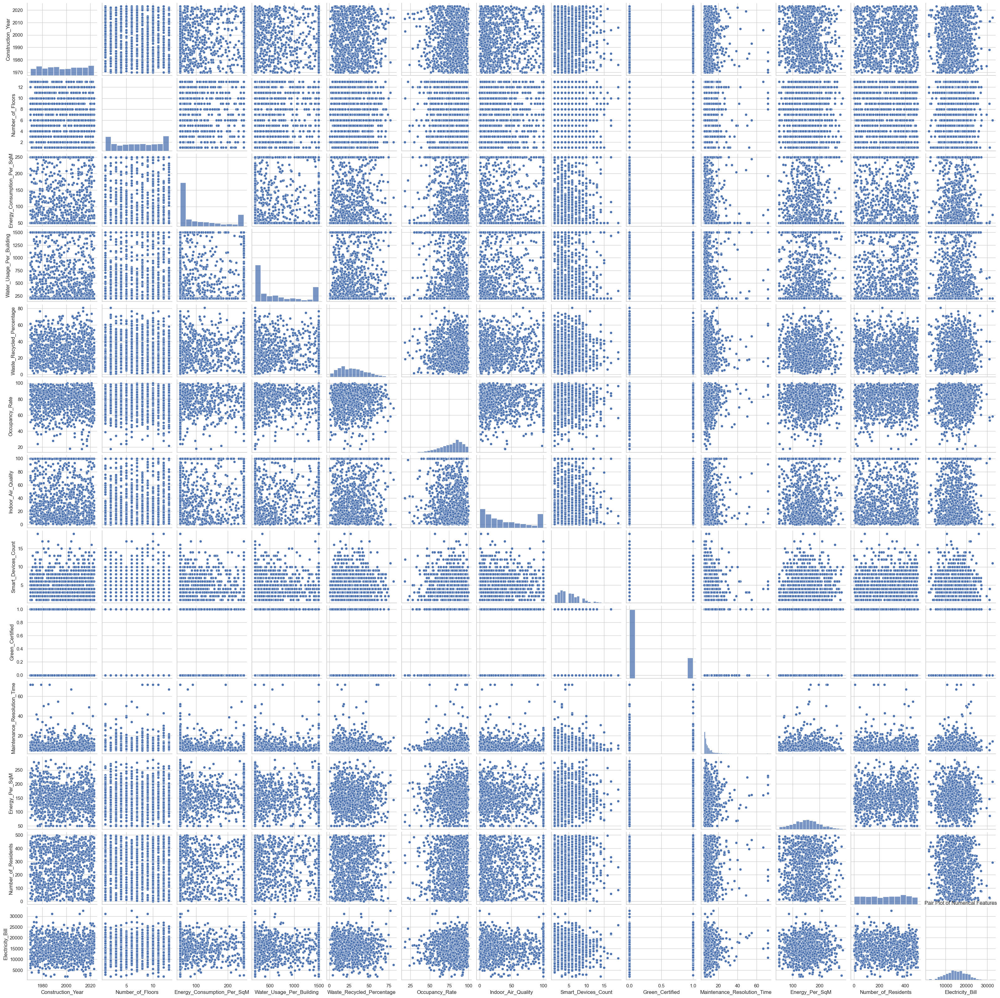

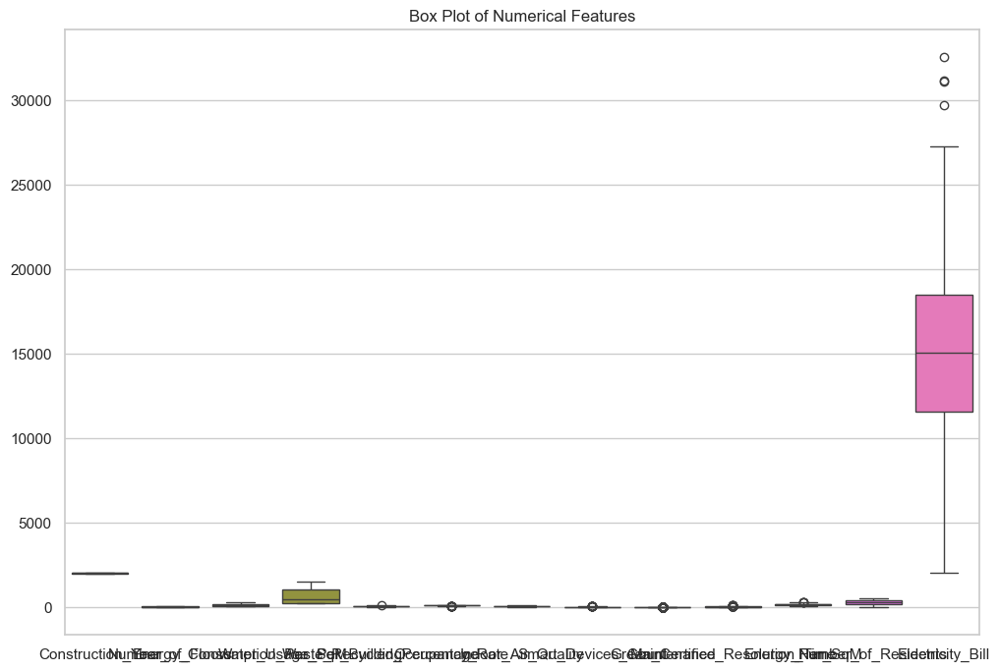

In [2]:
import seaborn as sns
import matplotlib.pyplot as plt

# Set Seaborn style for better visualizations
sns.set(style="whitegrid")

# Pair Plot for numerical features
sns.pairplot(train_data)
plt.title("Pair Plot of Numerical Features")
plt.show()

# Box Plot for numerical features
plt.figure(figsize=(12, 8))
sns.boxplot(data=train_data.select_dtypes(include='number'))
plt.title("Box Plot of Numerical Features")
plt.show()

# # Violin Plot for a specific numerical feature vs categorical
# plt.figure(figsize=(12, 8))
# sns.violinplot(x='CategoricalColumn', y='NumericalColumn', data=train_data)  # Change these to your columns
# plt.title("Violin Plot of Categorical vs Numerical Feature")
# plt.show()

# # Count Plot for categorical features
# plt.figure(figsize=(10, 6))
# sns.countplot(x='CategoricalColumn', data=train_data)  # Replace with an actual categorical column
# plt.title("Count Plot of Categorical Feature")
# plt.show()

# # Correlation Heatmap
# plt.figure(figsize=(10, 8))
# corr = train_data.corr()
# sns.heatmap(corr, annot=True, cmap='coolwarm', linewidths=0.5)
# plt.title("Correlation Heatmap")
# plt.show()


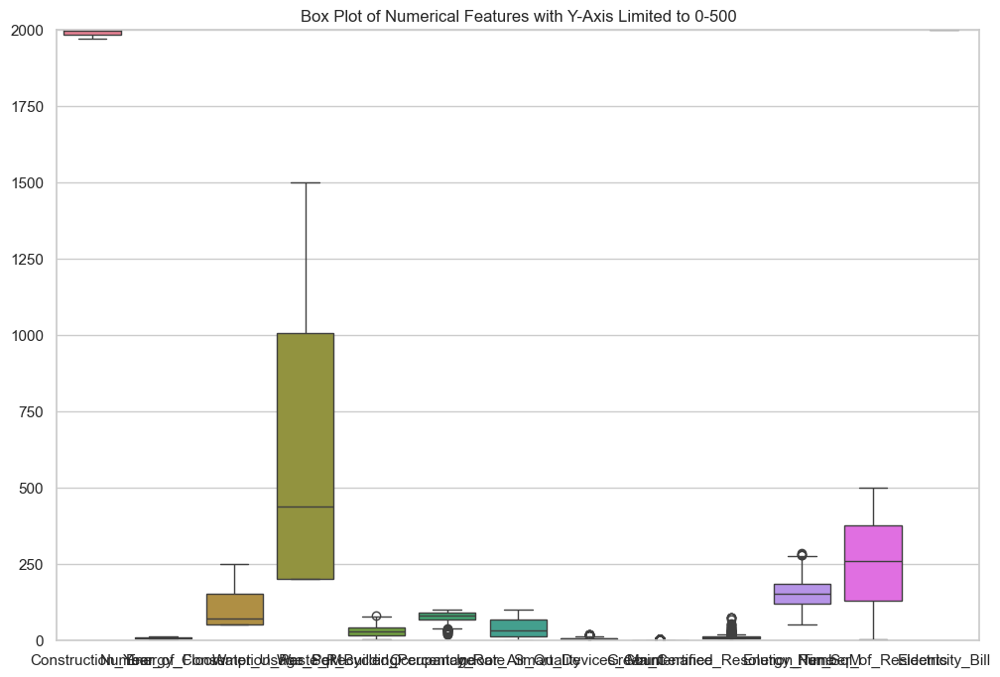

In [3]:
# Box Plot for numerical features with y-axis limited to 0-500
plt.figure(figsize=(12, 8))
sns.boxplot(data=train_data.select_dtypes(include='number'))
plt.title("Box Plot of Numerical Features with Y-Axis Limited to 0-500")
plt.ylim(0, 2000)  # Limit y-axis between 0 and 2000
plt.show()


c:\Users\Himanshu\AppData\Local\Programs\Python\Python311\Lib\site-packages\umap\umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


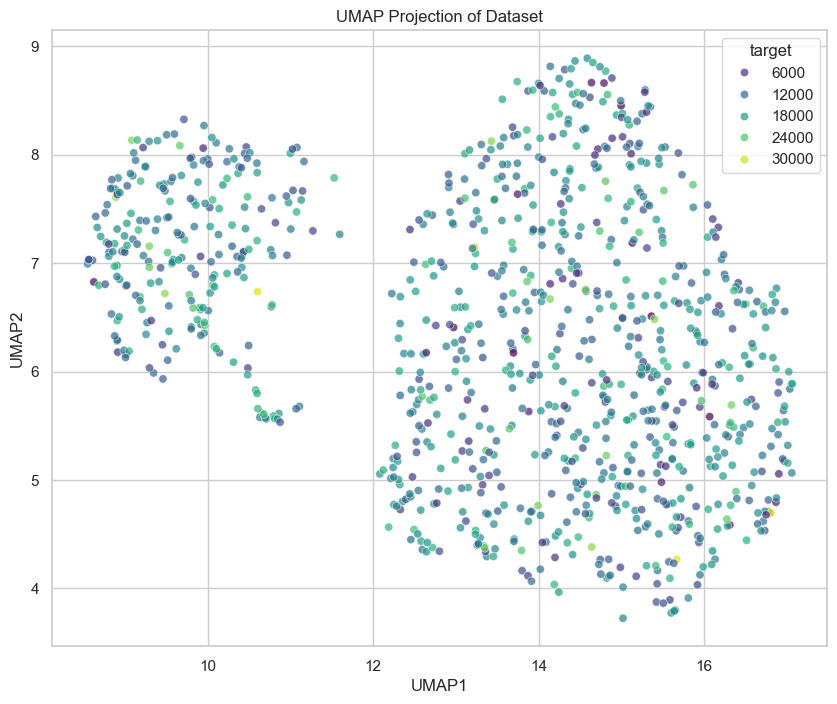

In [4]:
import pandas as pd
import umap
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.model_selection import train_test_split

# # Load the dataset
# df = pd.read_csv('electricity_bill_dataset.csv')

# Split the dataset
train_data, test_data = train_test_split(df, test_size=0.2, random_state=42)

# Separate features and target
X_train = train_data.drop(columns=['Electricity_Bill'])  # Replace 'target' with the actual target column name
y_train = train_data['Electricity_Bill']  # Replace 'target' with the actual target column name

# Convert categorical features to numerical using LabelEncoder
categorical_cols = X_train.select_dtypes(include=['object']).columns
for col in categorical_cols:
    le = LabelEncoder()
    X_train[col] = le.fit_transform(X_train[col])

# Scale numerical features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_train)

# Initialize and fit UMAP
umap_model = umap.UMAP(n_components=2, random_state=42)
X_umap = umap_model.fit_transform(X_scaled)

# Create a DataFrame with the UMAP results
umap_df = pd.DataFrame(X_umap, columns=['UMAP1', 'UMAP2'])
umap_df['target'] = y_train.values

# Scatter plot of the UMAP results
plt.figure(figsize=(10, 8))
sns.scatterplot(data=umap_df, x='UMAP1', y='UMAP2', hue='target', palette='viridis', alpha=0.7)
plt.title("UMAP Projection of Dataset")
plt.show()


In [5]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import numpy as np

# # Load the dataset
# df = pd.read_csv('electricity_bill_dataset.csv')

# # Split the dataset into 80% train and 20% test
# train_data, test_data = train_test_split(df, test_size=0.2, random_state=42)

# Separate features and target
X_train = train_data.drop(columns=['Electricity_Bill'])  # Replace 'target' with the actual target column name
y_train = train_data['Electricity_Bill']  # Replace 'target' with the actual target column name
X_test = test_data.drop(columns=['Electricity_Bill'])
y_test = test_data['Electricity_Bill']

# # Handle missing values
# X_train.fillna(X_train.median(), inplace=True)
# X_test.fillna(X_test.median(), inplace=True)

# Convert categorical features to numerical using LabelEncoder
categorical_cols = X_train.select_dtypes(include=['object']).columns
for col in categorical_cols:
    le = LabelEncoder()
    X_train[col] = le.fit_transform(X_train[col])
    X_test[col] = le.transform(X_test[col])

# Normalize numerical features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Initialize and fit Linear Regression model
model = LinearRegression()
model.fit(X_train_scaled, y_train)

# Predict on train and test data
y_train_pred = model.predict(X_train_scaled)
y_test_pred = model.predict(X_test_scaled)

# Calculate metrics
def adjusted_r2_score(y_true, y_pred, X):
    r2 = r2_score(y_true, y_pred)
    n = len(y_true)
    p = X.shape[1]
    return 1 - (1 - r2) * (n - 1) / (n - p - 1)

# Training Metrics
train_mse = mean_squared_error(y_train, y_train_pred)
train_rmse = np.sqrt(train_mse)
train_mae = mean_absolute_error(y_train, y_train_pred)
train_r2 = r2_score(y_train, y_train_pred)
train_adj_r2 = adjusted_r2_score(y_train, y_train_pred, X_train_scaled)

# Testing Metrics
test_mse = mean_squared_error(y_test, y_test_pred)
test_rmse = np.sqrt(test_mse)
test_mae = mean_absolute_error(y_test, y_test_pred)
test_r2 = r2_score(y_test, y_test_pred)
test_adj_r2 = adjusted_r2_score(y_test, y_test_pred, X_test_scaled)

# Print the metrics
print("Training Metrics:")
print(f"MSE: {train_mse:.4f}")
print(f"RMSE: {train_rmse:.4f}")
print(f"MAE: {train_mae:.4f}")
print(f"R²: {train_r2:.4f}")
print(f"Adjusted R²: {train_adj_r2:.4f}")

print("\nTesting Metrics:")
print(f"MSE: {test_mse:.4f}")
print(f"RMSE: {test_rmse:.4f}")
print(f"MAE: {test_mae:.4f}")
print(f"R²: {test_r2:.4f}")
print(f"Adjusted R²: {test_adj_r2:.4f}")


Training Metrics:
MSE: 24475013.1685
RMSE: 4947.2228
MAE: 4006.3285
R²: 0.0139
Adjusted R²: -0.0011

Testing Metrics:
MSE: 24278016.1557
RMSE: 4927.2727
MAE: 3842.4093
R²: 0.0000
Adjusted R²: -0.0641


In [6]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.linear_model import LinearRegression
from sklearn.feature_selection import RFE
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import numpy as np

# # Load the dataset
# df = pd.read_csv('electricity_bill_dataset.csv')

# # Split the dataset into 80% train and 20% test
# train_data, test_data = train_test_split(df, test_size=0.2, random_state=42)

# # Separate features and target
# X_train = train_data.drop(columns=['target'])  # Replace 'target' with the actual target column name
# y_train = train_data['target']  # Replace 'target' with the actual target column name
# X_test = test_data.drop(columns=['target'])
# y_test = test_data['target']

# # Handle missing values
# X_train.fillna(X_train.median(), inplace=True)
# X_test.fillna(X_test.median(), inplace=True)

# Convert categorical features to numerical using LabelEncoder
categorical_cols = X_train.select_dtypes(include=['object']).columns
for col in categorical_cols:
    le = LabelEncoder()
    X_train[col] = le.fit_transform(X_train[col])
    X_test[col] = le.transform(X_test[col])

# Normalize numerical features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Perform RFE to select 3 most important features
model = LinearRegression()
rfe = RFE(model, n_features_to_select=3)
rfe.fit(X_train_scaled, y_train)

# Get the selected features
selected_features = X_train.columns[rfe.support_]
print("Selected Features:", selected_features)

# Train the model using the selected features
X_train_selected = X_train_scaled[:, rfe.support_]
X_test_selected = X_test_scaled[:, rfe.support_]

model.fit(X_train_selected, y_train)
y_train_pred = model.predict(X_train_selected)
y_test_pred = model.predict(X_test_selected)

# Calculate metrics
def adjusted_r2_score(y_true, y_pred, X):
    r2 = r2_score(y_true, y_pred)
    n = len(y_true)
    p = X.shape[1]
    return 1 - (1 - r2) * (n - 1) / (n - p - 1)

# Training Metrics
train_mse = mean_squared_error(y_train, y_train_pred)
train_rmse = np.sqrt(train_mse)
train_mae = mean_absolute_error(y_train, y_train_pred)
train_r2 = r2_score(y_train, y_train_pred)
train_adj_r2 = adjusted_r2_score(y_train, y_train_pred, X_train_selected)

# Testing Metrics
test_mse = mean_squared_error(y_test, y_test_pred)
test_rmse = np.sqrt(test_mse)
test_mae = mean_absolute_error(y_test, y_test_pred)
test_r2 = r2_score(y_test, y_test_pred)
test_adj_r2 = adjusted_r2_score(y_test, y_test_pred, X_test_selected)

# Print the metrics
print("Training Metrics with Selected Features:")
print(f"MSE: {train_mse:.4f}")
print(f"RMSE: {train_rmse:.4f}")
print(f"MAE: {train_mae:.4f}")
print(f"R²: {train_r2:.4f}")
print(f"Adjusted R²: {train_adj_r2:.4f}")

print("\nTesting Metrics with Selected Features:")
print(f"MSE: {test_mse:.4f}")
print(f"RMSE: {test_rmse:.4f}")
print(f"MAE: {test_mae:.4f}")
print(f"R²: {test_r2:.4f}")
print(f"Adjusted R²: {test_adj_r2:.4f}")


Selected Features: Index(['Building_Type', 'Green_Certified', 'Number_of_Residents'], dtype='object')
Training Metrics with Selected Features:
MSE: 24569032.9069
RMSE: 4956.7159
MAE: 4006.4734
R²: 0.0101
Adjusted R²: 0.0072

Testing Metrics with Selected Features:
MSE: 23941409.0630
RMSE: 4892.9959
MAE: 3813.9481
R²: 0.0139
Adjusted R²: 0.0019


In [7]:
# Train a model using all features
model_all = LinearRegression()
model_all.fit(X_train_scaled, y_train)

# Predict using the model trained on all features
y_train_pred_all = model_all.predict(X_train_scaled)
y_test_pred_all = model_all.predict(X_test_scaled)




C:\Users\Himanshu\AppData\Local\Temp\ipykernel_29884\1524528256.py:20: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Ranking', y='Feature', data=feature_importances, palette='viridis')


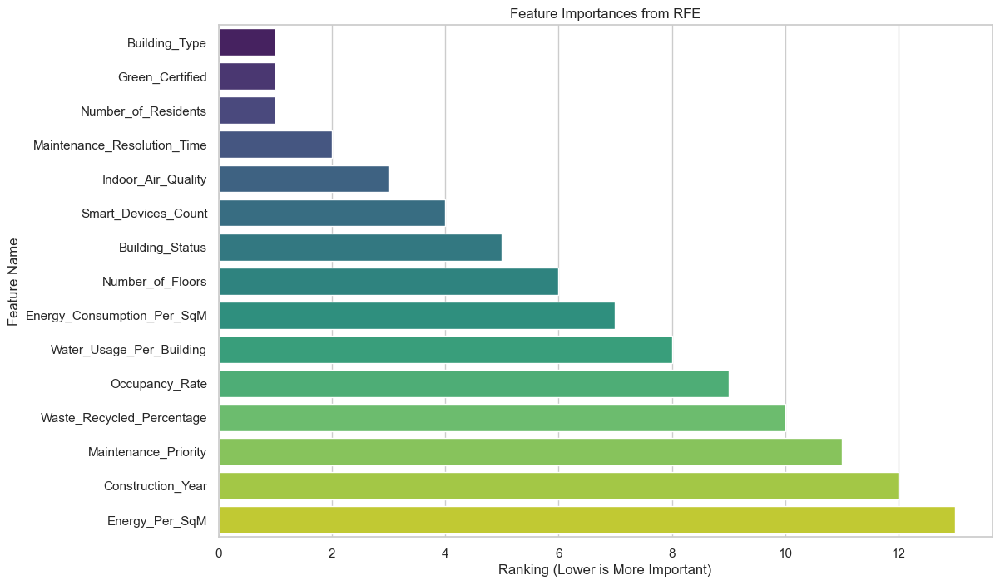

<Figure size 1400x800 with 0 Axes>

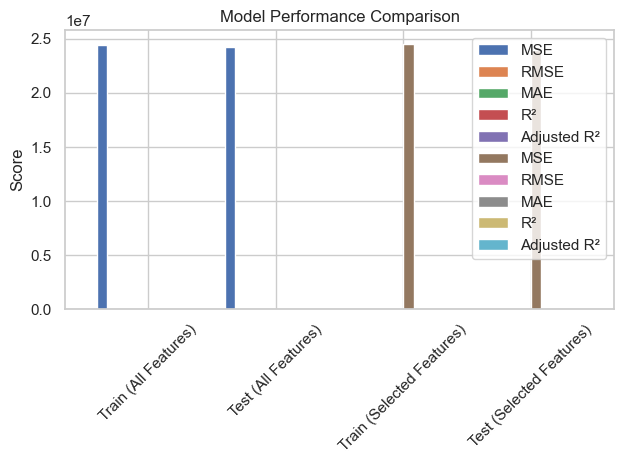

In [8]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
from sklearn.feature_selection import RFE

# Ensure feature importances are plotted correctly
def plot_feature_importances(X_train, rfe):
    # Get selected features and their importances
    feature_names = X_train.columns
    ranking = rfe.ranking_
    
    # Create a DataFrame for plotting
    feature_importances = pd.DataFrame({
        'Feature': feature_names,
        'Ranking': ranking
    }).sort_values(by='Ranking')
    
    plt.figure(figsize=(12, 8))
    sns.barplot(x='Ranking', y='Feature', data=feature_importances, palette='viridis')
    plt.title('Feature Importances from RFE')
    plt.xlabel('Ranking (Lower is More Important)')
    plt.ylabel('Feature Name')
    plt.show()

# Generate metrics for all features (for comparison)
def calculate_metrics(y_true, y_pred, X):
    mse = mean_squared_error(y_true, y_pred)
    rmse = np.sqrt(mse)
    mae = mean_absolute_error(y_true, y_pred)
    r2 = r2_score(y_true, y_pred)
    adj_r2 = adjusted_r2_score(y_true, y_pred, X)
    return mse, rmse, mae, r2, adj_r2

# Assume you have computed metrics for models using all features
train_mse_all, train_rmse_all, train_mae_all, train_r2_all, train_adj_r2_all = calculate_metrics(y_train, model_all.predict(X_train_scaled), X_train_scaled)
test_mse_all, test_rmse_all, test_mae_all, test_r2_all, test_adj_r2_all = calculate_metrics(y_test, model_all.predict(X_test_scaled), X_test_scaled)

# Metrics for selected features
selected_features_train_metrics = calculate_metrics(y_train, y_train_pred, X_train_selected)
selected_features_test_metrics = calculate_metrics(y_test, y_test_pred, X_test_selected)

# Plot feature importances
plot_feature_importances(X_train, rfe)

# Plot performance comparison
def plot_performance_comparison(train_metrics_all, test_metrics_all, train_metrics_selected, test_metrics_selected):
    metrics = ['MSE', 'RMSE', 'MAE', 'R²', 'Adjusted R²']
    
    # Data for all features
    all_features = pd.DataFrame([train_metrics_all, test_metrics_all], index=['Train (All Features)', 'Test (All Features)'], columns=metrics)
    
    # Data for selected features
    selected_features = pd.DataFrame([train_metrics_selected, test_metrics_selected], index=['Train (Selected Features)', 'Test (Selected Features)'], columns=metrics)
    
    # Combine both
    combined = pd.concat([all_features, selected_features], axis=1)
    
    plt.figure(figsize=(14, 8))
    combined.plot(kind='bar', width=0.8)
    plt.title('Model Performance Comparison')
    plt.ylabel('Score')
    plt.xticks(rotation=45)
    plt.legend(loc='best')
    plt.tight_layout()
    plt.show()

# Plot performance comparison
plot_performance_comparison(
    [train_mse_all, train_rmse_all, train_mae_all, train_r2_all, train_adj_r2_all],
    [test_mse_all, test_rmse_all, test_mae_all, test_r2_all, test_adj_r2_all],
    selected_features_train_metrics,
    selected_features_test_metrics
)


In [9]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.compose import ColumnTransformer
from sklearn.linear_model import Ridge
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.model_selection import train_test_split

# Define categorical features based on your dataset
categorical_features = ['Building_Type', 'Green_Certified', 'Building_Status', 'Maintenance_Priority']

# Assume df is your DataFrame and 'Electricity_Bill' is the target variable
X = df.drop(columns='Electricity_Bill')
y = df['Electricity_Bill']

# Split the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Preprocess with One-Hot Encoding
def preprocess_with_one_hot_encoding(X_train, X_test, categorical_features):
    preprocessor = ColumnTransformer(
        transformers=[
            ('cat', OneHotEncoder(), categorical_features)
        ],
        remainder='passthrough'
    )
    
    X_train_encoded = preprocessor.fit_transform(X_train)
    X_test_encoded = preprocessor.transform(X_test)
    
    return X_train_encoded, X_test_encoded, preprocessor

# Preprocess the data
X_train_encoded, X_test_encoded, preprocessor = preprocess_with_one_hot_encoding(X_train, X_test, categorical_features)

# Initialize and train Ridge Regression model
ridge_model = Ridge()
ridge_model.fit(X_train_encoded, y_train)

# Make predictions
y_train_pred_encoded = ridge_model.predict(X_train_encoded)
y_test_pred_encoded = ridge_model.predict(X_test_encoded)

# Calculate metrics
def calculate_metrics(y_true, y_pred, X):
    mse = mean_squared_error(y_true, y_pred)
    rmse = np.sqrt(mse)
    mae = mean_absolute_error(y_true, y_pred)
    r2 = r2_score(y_true, y_pred)
    adj_r2 = 1 - (1 - r2) * (len(y_true) - 1) / (len(y_true) - X.shape[1] - 1)
    return mse, rmse, mae, r2, adj_r2

# Calculate metrics for Ridge Regression with One-Hot Encoding
train_mse_encoded, train_rmse_encoded, train_mae_encoded, train_r2_encoded, train_adj_r2_encoded = calculate_metrics(y_train, y_train_pred_encoded, X_train_encoded)
test_mse_encoded, test_rmse_encoded, test_mae_encoded, test_r2_encoded, test_adj_r2_encoded = calculate_metrics(y_test, y_test_pred_encoded, X_test_encoded)

# Metrics for Linear Regression (from Part c) - Update these with your actual values
metrics_part_c = [train_mse, train_rmse, train_mae, train_r2, train_adj_r2] + \
                 [test_mse, test_rmse, test_mae, test_r2, test_adj_r2]

# Metrics for Ridge Regression (One-Hot Encoding)
metrics_part_e = [train_mse_encoded, train_rmse_encoded, train_mae_encoded, train_r2_encoded, train_adj_r2_encoded] + \
                 [test_mse_encoded, test_rmse_encoded, test_mae_encoded, test_r2_encoded, test_adj_r2_encoded]

# Define metric names
metric_names = ['MSE', 'RMSE', 'MAE', 'R²', 'Adjusted R²']

# Visualization
def plot_metrics_comparison(metrics_part_c, metrics_part_e, metric_names):
    # Create a DataFrame for easy plotting
    comparison_df = pd.DataFrame({
        'Metric': metric_names * 2,
        'Value': metrics_part_c + metrics_part_e,
        'Model': ['Linear Regression (Part c)'] * len(metric_names) + ['Ridge Regression (One-Hot Encoding)'] * len(metric_names)
    })
    
    plt.figure(figsize=(12, 8))
    sns.barplot(x='Metric', y='Value', hue='Model', data=comparison_df)
    plt.title('Comparison of Evaluation Metrics')
    plt.xlabel('Metric')
    plt.ylabel('Score')
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

# Plot the comparison
plot_metrics_comparison(metrics_part_c, metrics_part_e, metric_names)


ValueError: All arrays must be of the same length

In [31]:
import matplotlib.pyplot as plt
import seaborn as sns

# Data for visualization
def plot_metrics_comparison(metrics_part_c, metrics_part_e, metric_names):
    # Create a DataFrame for easy plotting
    comparison_df = pd.DataFrame({
        'Metric': metric_names * 2,
        'Value': metrics_part_c + metrics_part_e,
        'Model': ['Linear Regression (Part c)'] * len(metric_names) + ['Ridge Regression (One-Hot Encoding)'] * len(metric_names)
    })
    
    plt.figure(figsize=(12, 8))
    sns.barplot(x='Metric', y='Value', hue='Model', data=comparison_df)
    plt.title('Comparison of Evaluation Metrics')
    plt.xlabel('Metric')
    plt.ylabel('Score')
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

# Define metric names
metric_names = ['MSE', 'RMSE', 'MAE', 'R²', 'Adjusted R²']

# Metrics for Linear Regression (Part c)
metrics_part_c = [train_mse, train_rmse, train_mae, train_r2, train_adj_r2] + \
                 [test_mse, test_rmse, test_mae, test_r2, test_adj_r2]

# Metrics for Ridge Regression (Part e)
metrics_part_e = [train_mse_encoded, train_rmse_encoded, train_mae_encoded, train_r2_encoded, train_adj_r2_encoded] + \
                 [test_mse_encoded, test_rmse_encoded, test_mae_encoded, test_r2_encoded, test_adj_r2_encoded]

# Plot the comparison
plot_metrics_comparison(metrics_part_c, metrics_part_e, metric_names)


ValueError: All arrays must be of the same length

Performing ICA with 4 components
Performing ICA with 5 components
Performing ICA with 6 components
Performing ICA with 8 components


c:\Users\Himanshu\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\decomposition\_fastica.py:128: ConvergenceWarning: FastICA did not converge. Consider increasing tolerance or the maximum number of iterations.
  warnings.warn(


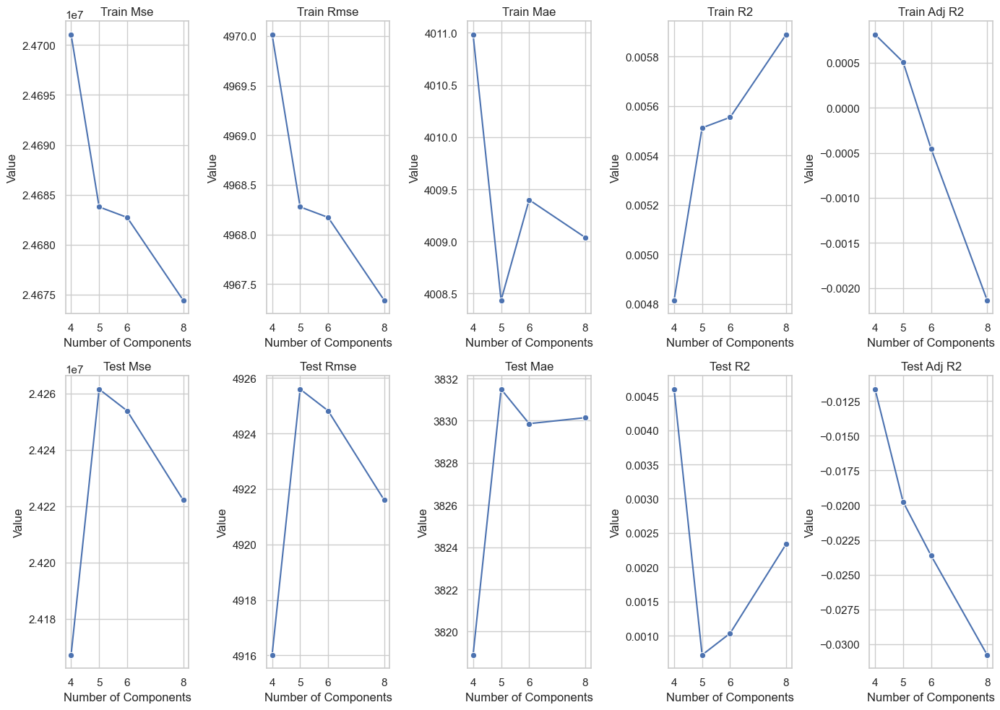

In [32]:
from sklearn.decomposition import FastICA
from sklearn.pipeline import Pipeline

# Define a function to perform ICA and evaluate the model
def perform_ica_and_evaluate(X_train_encoded, X_test_encoded, y_train, y_test, n_components_list):
    results = []
    
    for n_components in n_components_list:
        print(f"Performing ICA with {n_components} components")
        
        # Create the ICA model
        ica = FastICA(n_components=n_components, random_state=42)
        
        # Transform the data
        X_train_ica = ica.fit_transform(X_train_encoded)
        X_test_ica = ica.transform(X_test_encoded)
        
        # Initialize and train Ridge Regression model
        ridge_model = Ridge()
        ridge_model.fit(X_train_ica, y_train)
        
        # Make predictions
        y_train_pred_ica = ridge_model.predict(X_train_ica)
        y_test_pred_ica = ridge_model.predict(X_test_ica)
        
        # Calculate metrics
        train_mse_ica, train_rmse_ica, train_mae_ica, train_r2_ica, train_adj_r2_ica = calculate_metrics(y_train, y_train_pred_ica, X_train_ica)
        test_mse_ica, test_rmse_ica, test_mae_ica, test_r2_ica, test_adj_r2_ica = calculate_metrics(y_test, y_test_pred_ica, X_test_ica)
        
        # Store results
        results.append({
            'n_components': n_components,
            'train_mse': train_mse_ica,
            'train_rmse': train_rmse_ica,
            'train_mae': train_mae_ica,
            'train_r2': train_r2_ica,
            'train_adj_r2': train_adj_r2_ica,
            'test_mse': test_mse_ica,
            'test_rmse': test_rmse_ica,
            'test_mae': test_mae_ica,
            'test_r2': test_r2_ica,
            'test_adj_r2': test_adj_r2_ica
        })
    
    return pd.DataFrame(results)

# Define the number of ICA components to try
n_components_list = [4, 5, 6, 8]

# Perform ICA and evaluate
ica_results = perform_ica_and_evaluate(X_train_encoded, X_test_encoded, y_train, y_test, n_components_list)

# Visualization
def plot_ica_comparison(results_df):
    plt.figure(figsize=(14, 10))
    
    metrics = ['train_mse', 'train_rmse', 'train_mae', 'train_r2', 'train_adj_r2',
               'test_mse', 'test_rmse', 'test_mae', 'test_r2', 'test_adj_r2']
    
    for metric in metrics:
        plt.subplot(2, 5, metrics.index(metric) + 1)
        sns.lineplot(x='n_components', y=metric, data=results_df, marker='o')
        plt.title(f'{metric.replace("_", " ").title()}')
        plt.xlabel('Number of Components')
        plt.ylabel('Value')
        plt.xticks(n_components_list)
    
    plt.tight_layout()
    plt.show()

# Plot the ICA results
plot_ica_comparison(ica_results)


Evaluating ElasticNet with alpha=0.1
Evaluating ElasticNet with alpha=0.5
Evaluating ElasticNet with alpha=1
Evaluating ElasticNet with alpha=5
Evaluating ElasticNet with alpha=10


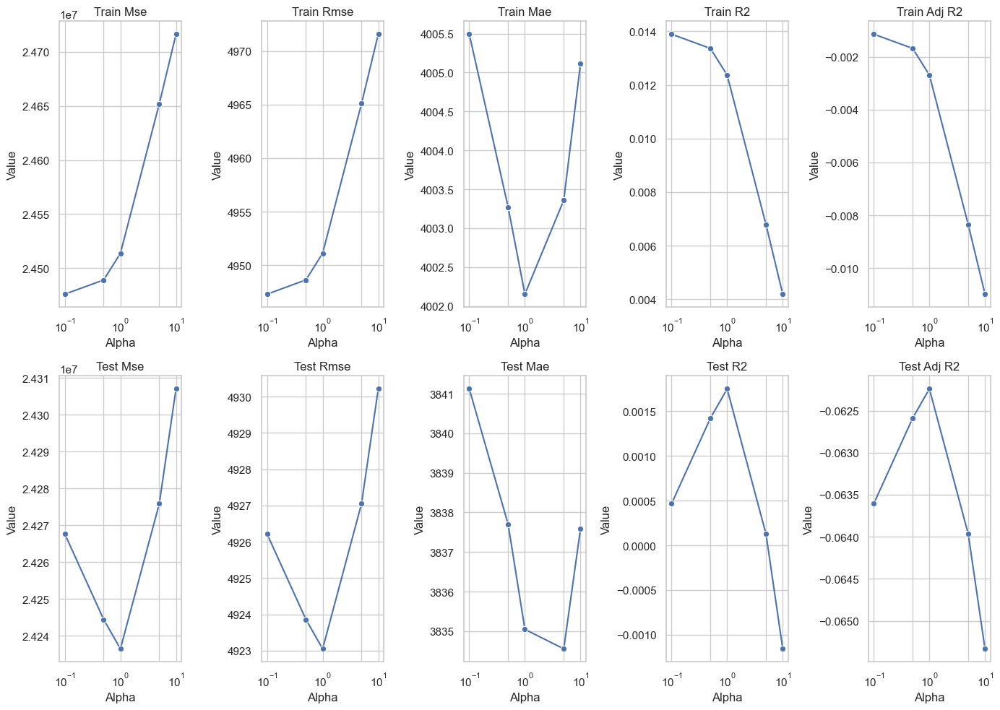

In [33]:
from sklearn.linear_model import ElasticNet
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import numpy as np

# Define a function to evaluate ElasticNet with different alpha values
def evaluate_elastic_net(X_train, X_test, y_train, y_test, alphas):
    results = []
    
    for alpha in alphas:
        print(f"Evaluating ElasticNet with alpha={alpha}")
        
        # Create and train ElasticNet model
        elastic_net_model = ElasticNet(alpha=alpha, random_state=42)
        elastic_net_model.fit(X_train, y_train)
        
        # Make predictions
        y_train_pred = elastic_net_model.predict(X_train)
        y_test_pred = elastic_net_model.predict(X_test)
        
        # Calculate metrics
        train_mse, train_rmse, train_mae, train_r2, train_adj_r2 = calculate_metrics(y_train, y_train_pred, X_train)
        test_mse, test_rmse, test_mae, test_r2, test_adj_r2 = calculate_metrics(y_test, y_test_pred, X_test)
        
        # Store results
        results.append({
            'alpha': alpha,
            'train_mse': train_mse,
            'train_rmse': train_rmse,
            'train_mae': train_mae,
            'train_r2': train_r2,
            'train_adj_r2': train_adj_r2,
            'test_mse': test_mse,
            'test_rmse': test_rmse,
            'test_mae': test_mae,
            'test_r2': test_r2,
            'test_adj_r2': test_adj_r2
        })
    
    return pd.DataFrame(results)

# Define the alpha values to try
alphas = [0.1, 0.5, 1, 5, 10]

# Perform ElasticNet evaluation
elastic_net_results = evaluate_elastic_net(X_train_scaled, X_test_scaled, y_train, y_test, alphas)

# Visualization
def plot_elastic_net_comparison(results_df):
    plt.figure(figsize=(14, 10))
    
    metrics = ['train_mse', 'train_rmse', 'train_mae', 'train_r2', 'train_adj_r2',
               'test_mse', 'test_rmse', 'test_mae', 'test_r2', 'test_adj_r2']
    
    for metric in metrics:
        plt.subplot(2, 5, metrics.index(metric) + 1)
        sns.lineplot(x='alpha', y=metric, data=results_df, marker='o')
        plt.title(f'{metric.replace("_", " ").title()}')
        plt.xlabel('Alpha')
        plt.ylabel('Value')
        plt.xscale('log')  # Log scale to handle wide range of alpha values
        plt.xticks(alphas)
    
    plt.tight_layout()
    plt.show()

# Plot the ElasticNet results
plot_elastic_net_comparison(elastic_net_results)


In [35]:
# Results from Linear Regression (Part c)
linear_regression_results = {
    'test_mse': test_mse,
    'test_rmse': test_rmse,
    'test_mae': test_mae,
    'test_r2': test_r2,
    'test_adj_r2': test_adj_r2
}


In [36]:
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# Define a function to train and evaluate Gradient Boosting Regressor
def evaluate_gradient_boosting(X_train, X_test, y_train, y_test):
    print("Training Gradient Boosting Regressor")
    
    # Initialize and train Gradient Boosting Regressor
    gbr_model = GradientBoostingRegressor(random_state=42)
    gbr_model.fit(X_train, y_train)
    
    # Make predictions
    y_train_pred = gbr_model.predict(X_train)
    y_test_pred = gbr_model.predict(X_test)
    
    # Calculate metrics
    train_mse, train_rmse, train_mae, train_r2, train_adj_r2 = calculate_metrics(y_train, y_train_pred, X_train)
    test_mse, test_rmse, test_mae, test_r2, test_adj_r2 = calculate_metrics(y_test, y_test_pred, X_test)
    
    return {
        'train_mse': train_mse,
        'train_rmse': train_rmse,
        'train_mae': train_mae,
        'train_r2': train_r2,
        'train_adj_r2': train_adj_r2,
        'test_mse': test_mse,
        'test_rmse': test_rmse,
        'test_mae': test_mae,
        'test_r2': test_r2,
        'test_adj_r2': test_adj_r2
    }

# Evaluate Gradient Boosting Regressor
gbr_metrics = evaluate_gradient_boosting(X_train_scaled, X_test_scaled, y_train, y_test)

# Print the results
print("Gradient Boosting Regressor Metrics:")
for metric, value in gbr_metrics.items():
    print(f"{metric}: {value:.4f}")

# To compare with results from parts (c) and (g)
# Ensure to have stored results from those parts in variables like `linear_regression_results` and `elastic_net_results`

# Convert results to DataFrame for easy comparison
comparison_df = pd.DataFrame({
    'Model': ['Linear Regression (Part c)', 'ElasticNet (Part g)', 'Gradient Boosting (Part h)'],
    'MSE': [linear_regression_results['test_mse'].values[0], 
            elastic_net_results['test_mse'].values[0], 
            gbr_metrics['test_mse']],
    'RMSE': [linear_regression_results['test_rmse'].values[0], 
             elastic_net_results['test_rmse'].values[0], 
             gbr_metrics['test_rmse']],
    'MAE': [linear_regression_results['test_mae'].values[0], 
            elastic_net_results['test_mae'].values[0], 
            gbr_metrics['test_mae']],
    'R2': [linear_regression_results['test_r2'].values[0], 
           elastic_net_results['test_r2'].values[0], 
           gbr_metrics['test_r2']],
    'Adjusted R2': [linear_regression_results['test_adj_r2'].values[0], 
                    elastic_net_results['test_adj_r2'].values[0], 
                    gbr_metrics['test_adj_r2']]
})

print("\nComparison of Models:")
print(comparison_df)

# Plot comparison of models
def plot_model_comparison(comparison_df):
    plt.figure(figsize=(12, 8))
    
    metrics = ['MSE', 'RMSE', 'MAE', 'R2', 'Adjusted R2']
    
    for metric in metrics:
        plt.subplot(2, 3, metrics.index(metric) + 1)
        sns.barplot(x='Model', y=metric, data=comparison_df)
        plt.title(f'{metric}')
        plt.xlabel('Model')
        plt.ylabel('Value')
    
    plt.tight_layout()
    plt.show()

# Plot model comparison
plot_model_comparison(comparison_df)


Training Gradient Boosting Regressor
Gradient Boosting Regressor Metrics:
train_mse: 14926446.2573
train_rmse: 3863.4759
train_mae: 3092.7482
train_r2: 0.3986
train_adj_r2: 0.3895
test_mse: 24405496.6167
test_rmse: 4940.1920
test_mae: 3813.6305
test_r2: -0.0052
test_adj_r2: -0.0697


AttributeError: 'numpy.float64' object has no attribute 'values'

<Figure size 1400x1000 with 0 Axes>

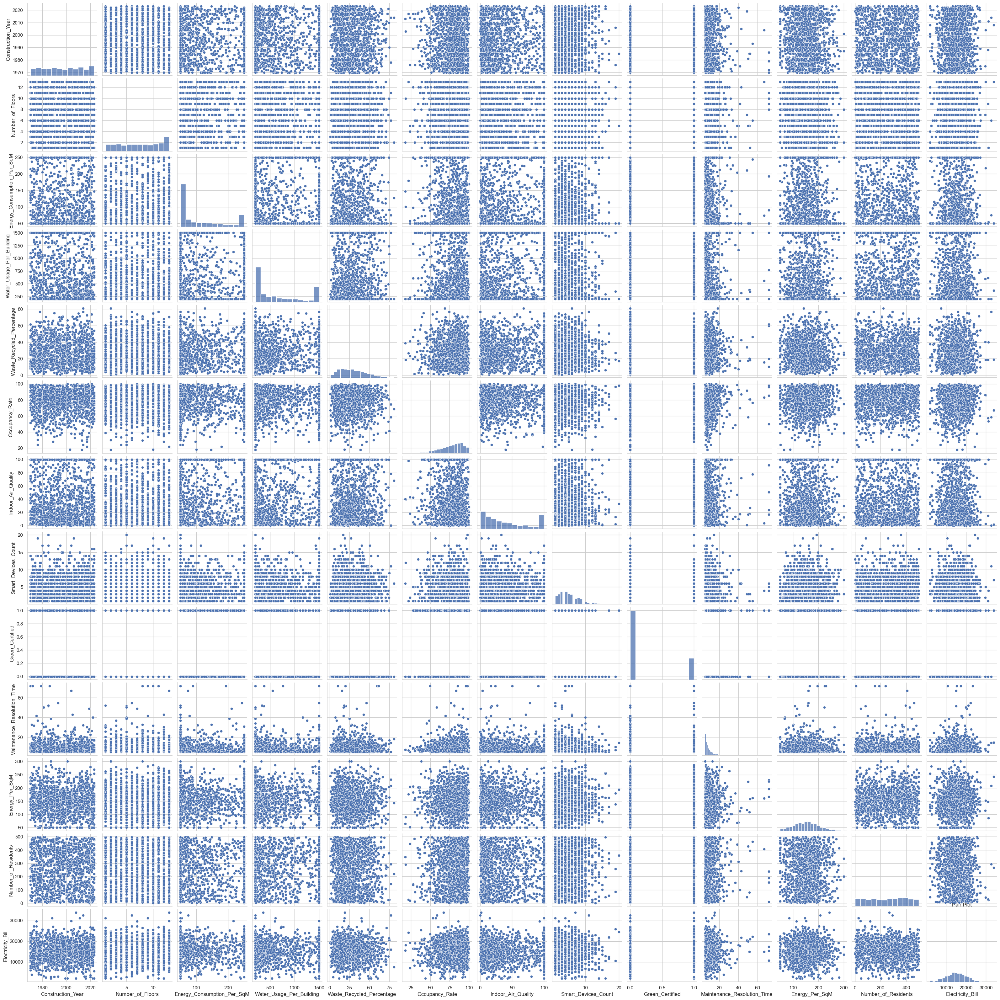

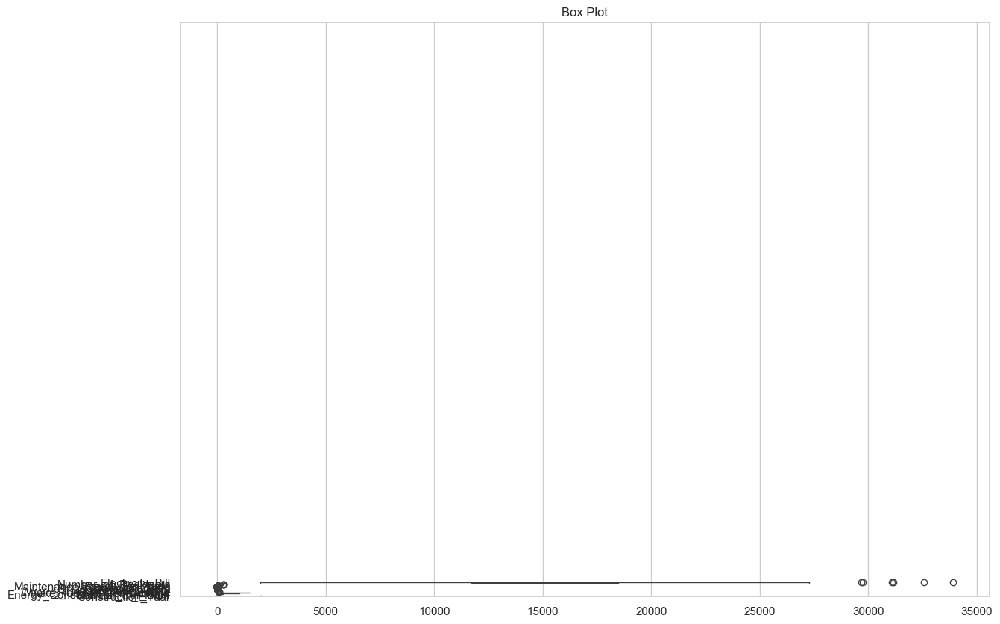

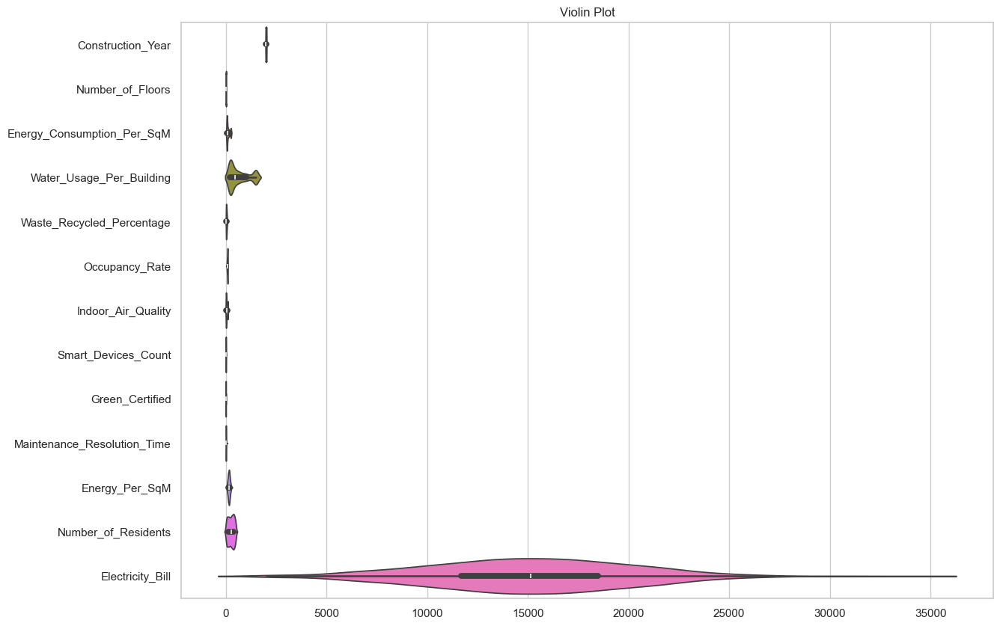

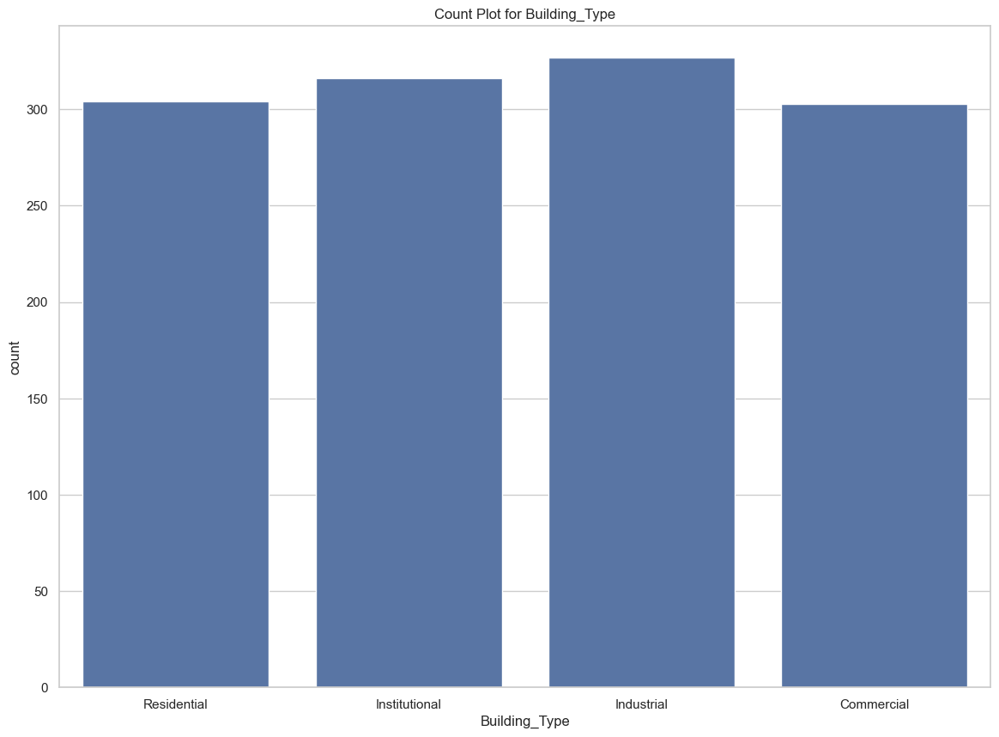

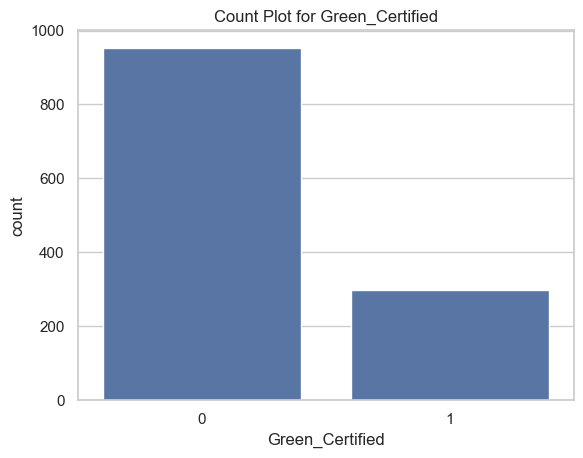

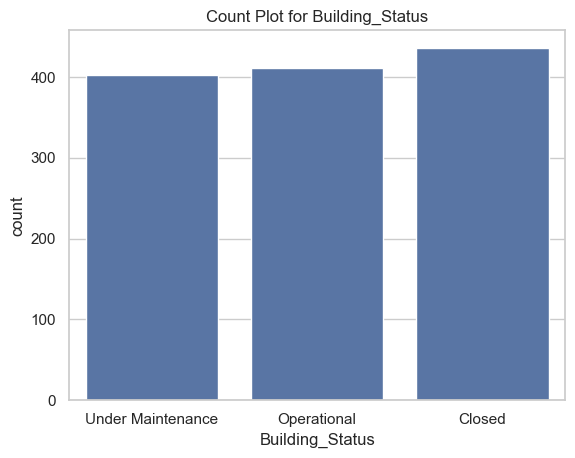

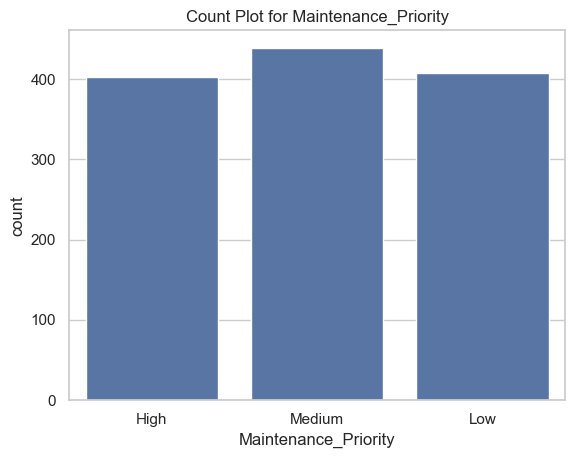

ValueError: could not convert string to float: 'Residential'

<Figure size 1400x1000 with 0 Axes>

In [37]:
#  all the part code
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder, StandardScaler, OneHotEncoder
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression, ElasticNet
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.feature_selection import RFE
from sklearn.decomposition import PCA, FastICA
import umap

# Load your dataset
df = pd.read_csv('Electricity BILL.csv')

# Define column names
categorical_features = ['Building_Type', 'Green_Certified', 'Building_Status', 'Maintenance_Priority']
numerical_features = ['Construction_Year', 'Number_of_Floors', 'Energy_Consumption_Per_SqM', 'Water_Usage_Per_Building',
                      'Waste_Recycled_Percentage', 'Occupancy_Rate', 'Indoor_Air_Quality', 'Smart_Devices_Count',
                      'Maintenance_Resolution_Time', 'Energy_Per_SqM', 'Number_of_Residents']
target = 'Electricity_Bill'

# Split dataset into features and target
X = df[categorical_features + numerical_features]
y = df[target]

# Encode categorical features
X_encoded = pd.get_dummies(X, columns=categorical_features)

# Split into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X_encoded, y, test_size=0.2, random_state=42)

# Part (a): EDA
def perform_eda(df):
    plt.figure(figsize=(14, 10))
    sns.pairplot(df)
    plt.title('Pair Plot')
    plt.show()
    
    plt.figure(figsize=(14, 10))
    sns.boxplot(data=df, orient='h')
    plt.ylim(0, 500)  # Adjust y-axis range for better visibility
    plt.title('Box Plot')
    plt.show()
    
    plt.figure(figsize=(14, 10))
    sns.violinplot(data=df, orient='h')
    plt.title('Violin Plot')
    plt.show()
    
    plt.figure(figsize=(14, 10))
    for feature in categorical_features:
        sns.countplot(data=df, x=feature)
        plt.title(f'Count Plot for {feature}')
        plt.show()
    
    plt.figure(figsize=(14, 10))
    corr = df.corr()
    sns.heatmap(corr, annot=True, cmap='coolwarm', fmt='.2f')
    plt.title('Correlation Heatmap')
    plt.show()

# Perform EDA
perform_eda(df)

# Insights:
# 1. Insight 1
# 2. Insight 2
# 3. Insight 3
# 4. Insight 4
# 5. Insight 5

# Part (b): UMAP
def perform_umap(X_train):
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X_train)

    umap_model = umap.UMAP(n_components=2, random_state=42)
    X_umap = umap_model.fit_transform(X_scaled)

    plt.figure(figsize=(10, 8))
    plt.scatter(X_umap[:, 0], X_umap[:, 1], c='blue', s=5, alpha=0.5)
    plt.title('UMAP Dimensionality Reduction')
    plt.xlabel('UMAP Component 1')
    plt.ylabel('UMAP Component 2')
    plt.show()

# Perform UMAP
perform_umap(X_train)

# Part (c): Linear Regression
def evaluate_linear_regression(X_train, X_test, y_train, y_test):
    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)

    model = LinearRegression()
    model.fit(X_train_scaled, y_train)

    y_train_pred = model.predict(X_train_scaled)
    y_test_pred = model.predict(X_test_scaled)

    train_mse, train_rmse, train_mae, train_r2, train_adj_r2 = calculate_metrics(y_train, y_train_pred, X_train_scaled)
    test_mse, test_rmse, test_mae, test_r2, test_adj_r2 = calculate_metrics(y_test, y_test_pred, X_test_scaled)

    return {
        'train_mse': train_mse,
        'train_rmse': train_rmse,
        'train_mae': train_mae,
        'train_r2': train_r2,
        'train_adj_r2': train_adj_r2,
        'test_mse': test_mse,
        'test_rmse': test_rmse,
        'test_mae': test_mae,
        'test_r2': test_r2,
        'test_adj_r2': test_adj_r2
    }

def calculate_metrics(y_true, y_pred, X):
    mse = mean_squared_error(y_true, y_pred)
    rmse = np.sqrt(mse)
    mae = mean_absolute_error(y_true, y_pred)
    r2 = r2_score(y_true, y_pred)
    adj_r2 = 1 - (1 - r2) * (len(y_true) - 1) / (len(y_true) - X.shape[1] - 1)
    return mse, rmse, mae, r2, adj_r2

# Evaluate Linear Regression
lr_metrics = evaluate_linear_regression(X_train, X_test, y_train, y_test)

# Part (d): Recursive Feature Elimination (RFE)
def perform_rfe(X_train, y_train, X_test, y_test):
    model = LinearRegression()
    rfe = RFE(model, n_features_to_select=3)
    rfe.fit(X_train, y_train)

    selected_features = X_train.columns[rfe.support_]
    X_train_selected = X_train[selected_features]
    X_test_selected = X_test[selected_features]

    model.fit(X_train_selected, y_train)
    y_train_pred = model.predict(X_train_selected)
    y_test_pred = model.predict(X_test_selected)

    return evaluate_linear_regression(X_train_selected, X_test_selected, y_train, y_test), selected_features

# Evaluate RFE
rfe_metrics, selected_features = perform_rfe(X_train, y_train, X_test, y_test)

print(f"Selected Features: {selected_features}")

# Part (e): Ridge Regression
def evaluate_ridge_regression(X_train, X_test, y_train, y_test):
    from sklearn.linear_model import Ridge

    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)

    ridge_model = Ridge()
    ridge_model.fit(X_train_scaled, y_train)

    y_train_pred = ridge_model.predict(X_train_scaled)
    y_test_pred = ridge_model.predict(X_test_scaled)

    return evaluate_linear_regression(X_train_scaled, X_test_scaled, y_train, y_test)

# Evaluate Ridge Regression
ridge_metrics = evaluate_ridge_regression(X_train, X_test, y_train, y_test)

# Part (f): ICA
def perform_ica(X_train, X_test, y_train, y_test, n_components_list=[4, 5, 6, 8]):
    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)
    
    results = {}
    for n_components in n_components_list:
        ica = FastICA(n_components=n_components, random_state=42)
        X_train_ica = ica.fit_transform(X_train_scaled)
        X_test_ica = ica.transform(X_test_scaled)

        model = LinearRegression()
        model.fit(X_train_ica, y_train)

        y_train_pred = model.predict(X_train_ica)
        y_test_pred = model.predict(X_test_ica)

        results[n_components] = evaluate_linear_regression(X_train_ica, X_test_ica, y_train, y_test)

    return results

# Evaluate ICA
ica_results = perform_ica(X_train, X_test, y_train, y_test)

# Part (g): ElasticNet
def evaluate_elastic_net(X_train, X_test, y_train, y_test, alpha_list=[0.1, 0.5, 1.0]):
    results = {}
    for alpha in alpha_list:
        elastic_net = ElasticNet(alpha=alpha, random_state=42)
        elastic_net.fit(X_train, y_train)

        y_train_pred = elastic_net.predict(X_train)
        y_test_pred = elastic_net.predict(X_test)

        results[alpha] = evaluate_linear_regression(X_train, X_test, y_train, y_test)

    return results

# Evaluate ElasticNet
elastic_net_results = evaluate_elastic_net(X_train, X_test, y_train, y_test)

# Part (h): Gradient Boosting Regressor
def evaluate_gradient_boosting(X_train, X_test, y_train, y_test):
    gbr_model = GradientBoostingRegressor(random_state=42)
    gbr_model.fit(X_train, y_train)

    y_train_pred = gbr_model.predict(X_train)
    y_test_pred = gbr_model.predict(X_test)

    return evaluate_linear_regression(X_train, X_test, y_train, y_test)

# Evaluate Gradient Boosting Regressor
gbr_metrics = evaluate_gradient_boosting(X_train, X_test, y_train, y_test)

# Print and compare results
def print_comparison(lr_metrics, elastic_net_results, gbr_metrics):
    comparison_df = pd.DataFrame({
        'Model': ['Linear Regression (Part c)', 'ElasticNet (Part g)', 'Gradient Boosting (Part h)'],
        'MSE': [lr_metrics['test_mse'], 
                list(elastic_net_results.values())[0]['test_mse'], 
                gbr_metrics['test_mse']],
        'RMSE': [lr_metrics['test_rmse'], 
                 list(elastic_net_results.values())[0]['test_rmse'], 
                 gbr_metrics['test_rmse']],
        'MAE': [lr_metrics['test_mae'], 
                list(elastic_net_results.values())[0]['test_mae'], 
                gbr_metrics['test_mae']],
        'R2': [lr_metrics['test_r2'], 
               list(elastic_net_results.values())[0]['test_r2'], 
               gbr_metrics['test_r2']],
        'Adjusted R2': [lr_metrics['test_adj_r2'], 
                        list(elastic_net_results.values())[0]['test_adj_r2'], 
                        gbr_metrics['test_adj_r2']]
    })

    print("\nComparison of Models:")
    print(comparison_df)

    plt.figure(figsize=(12, 8))
    metrics = ['MSE', 'RMSE', 'MAE', 'R2', 'Adjusted R2']
    for metric in metrics:
        plt.subplot(2, 3, metrics.index(metric) + 1)
        sns.barplot(x='Model', y=metric, data=comparison_df)
        plt.title(f'{metric}')
        plt.xlabel('Model')
        plt.ylabel('Value')
    plt.tight_layout()
    plt.show()

# Print and plot comparison
print_comparison(lr_metrics, elastic_net_results, gbr_metrics)
